In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import cv2


In [2]:
# defining the imshow function
def imshow(title = 'Image',image = None,size = 10):
    w,h = image.shape[1],image.shape[0]
    aspect_ratio = w/h
    plt.figure(figsize=(size*aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()


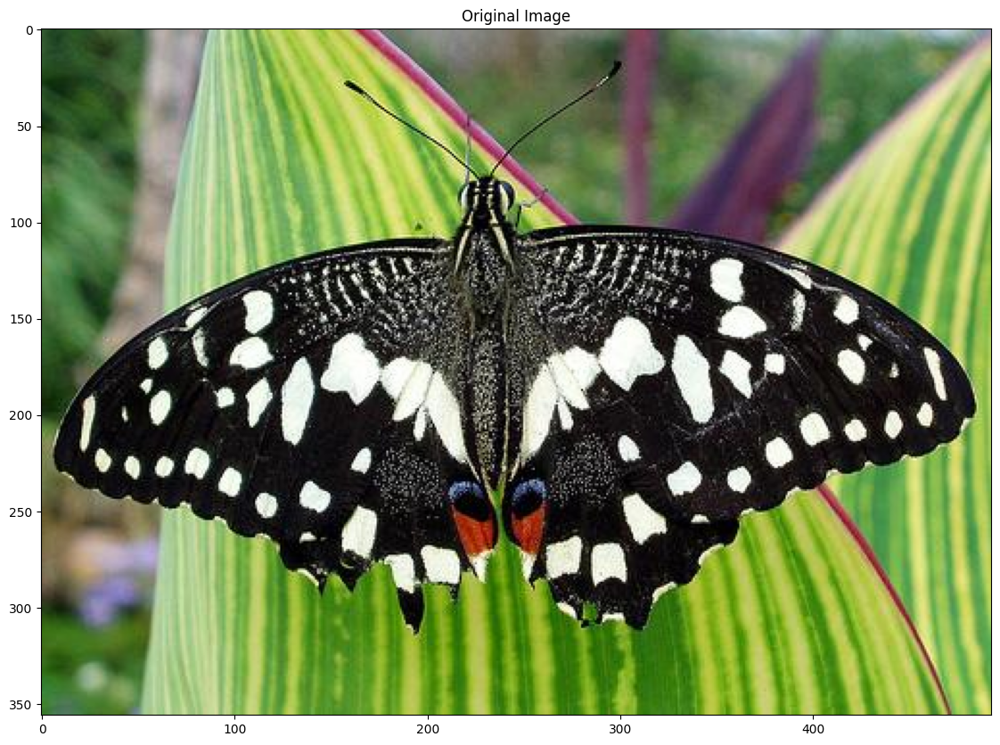

In [3]:
img = cv2.imread('C:\\Users\\abhin\\OneDrive\\Documents\\GitHub\\Computer-Vision\\data\\butterfly.jpg')
imshow('Original Image',img)

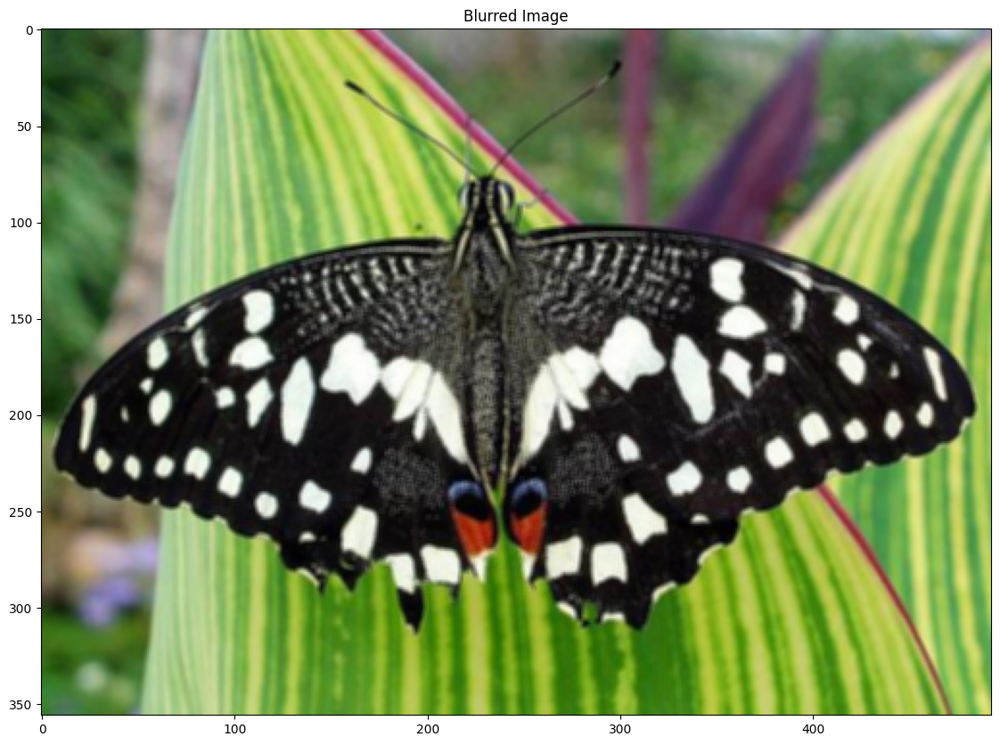

In [4]:
# creating our 3x3 kernel
kernel_3x3 = np.ones((3,3),np.float32)/9


# we use the cv2.filter2D to convolve the kernel with an image

blurred = cv2.filter2D(img,-1,kernel_3x3)   # -1 is the depth of the output image
imshow('Blurred Image',blurred)

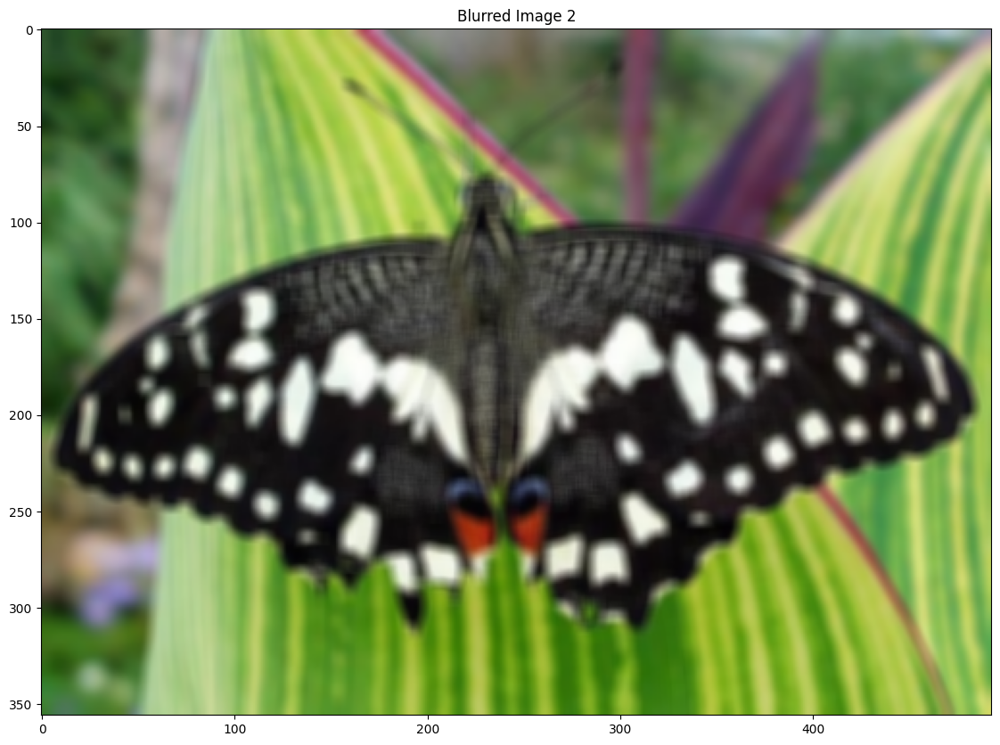

In [5]:
# creating 7x7 kernel 
kernel_7x7 = np.ones((7,7),np.float32)/49

blurred2 = cv2.filter2D(img,-1,kernel_7x7)
imshow('Blurred Image 2',blurred2)

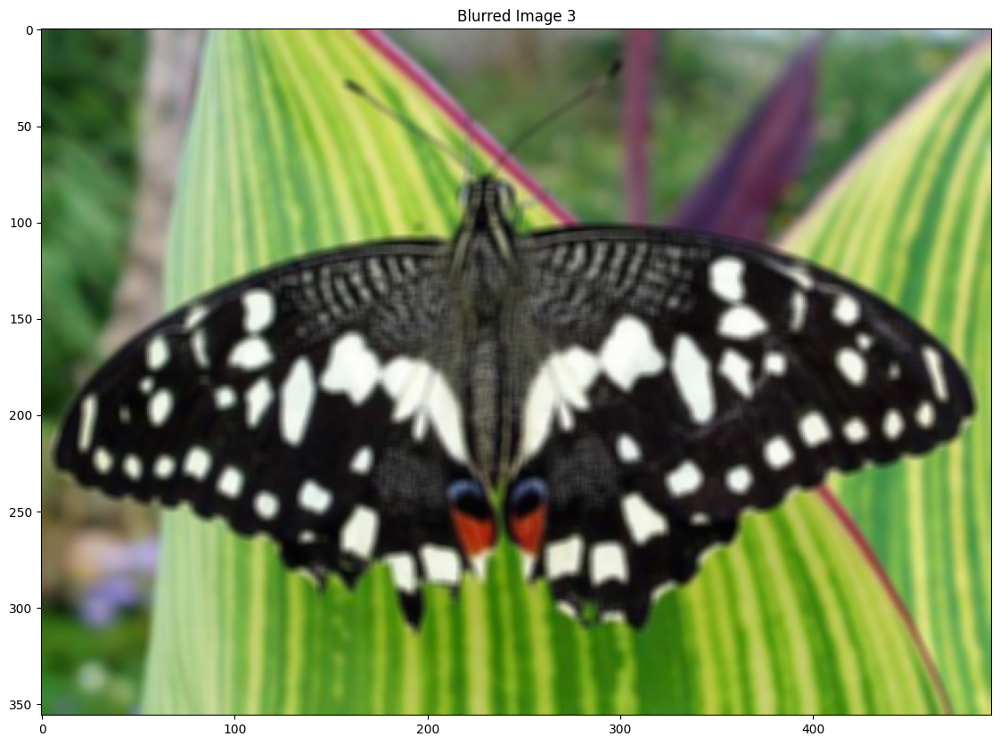

In [6]:
# creating 5 x 5 kernel 

kernel_5x5 = np.ones((5,5),np.float32)/25
blurred3 = cv2.filter2D(img,-1,kernel_5x5)
imshow('Blurred Image 3',blurred3) 

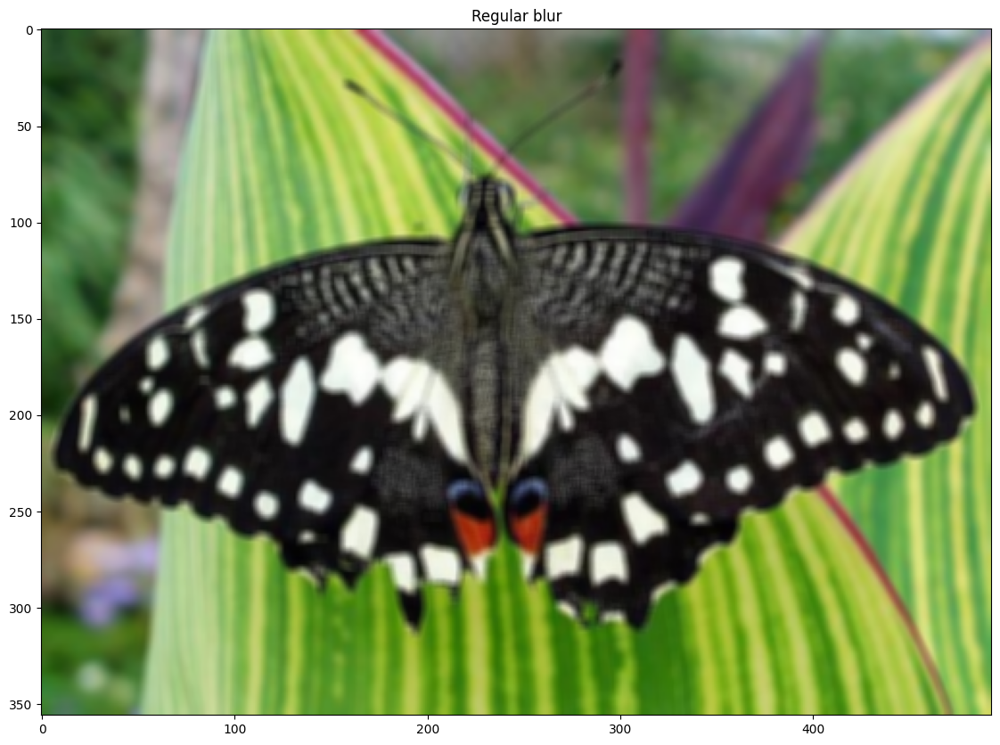

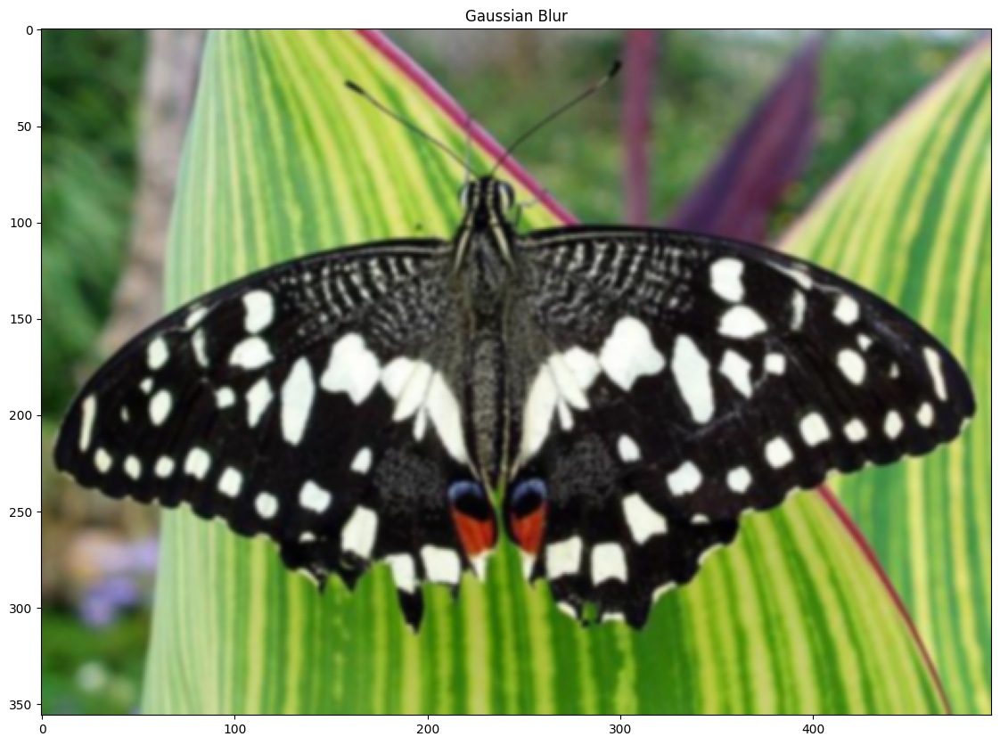

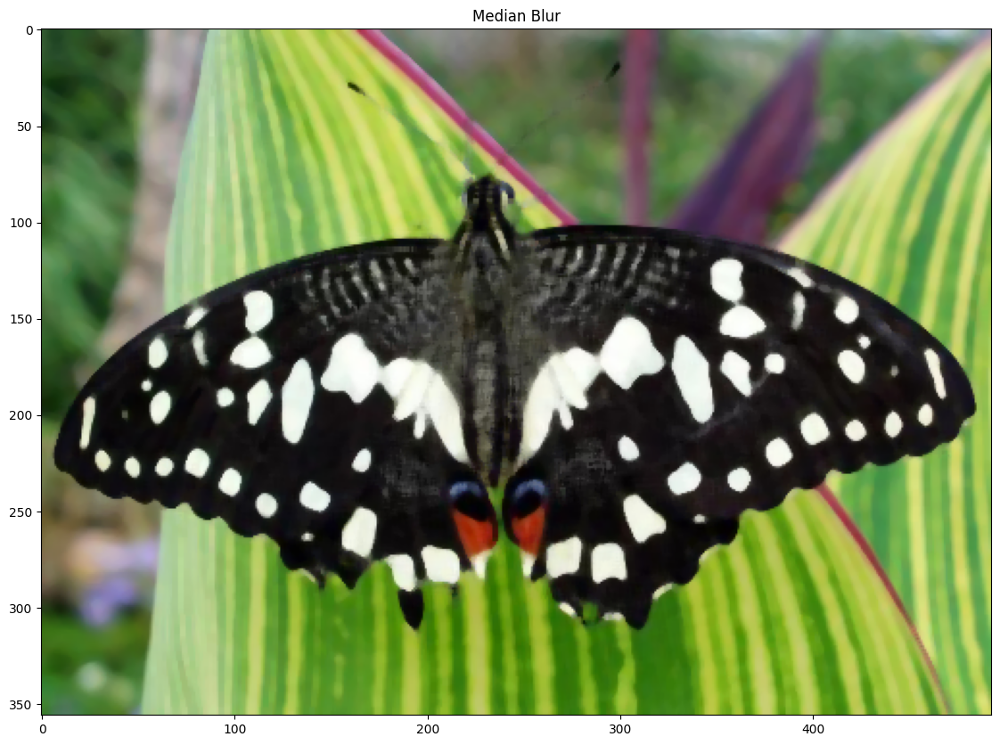

In [7]:
# Other blurring methods in OpenCV
# - Regular Blur
# - Gaussian Blur
# - Median Blur

# Regular Blur
# box need to be positive and odd
blurred4 = cv2.blur(img,(5,5))
imshow('Regular blur',blurred4)

# Gaussian Blur
# instead of box filter , we are using gaussian kernel 

gaussian_blur = cv2.GaussianBlur(img,(5,5),0)
imshow('Gaussian Blur',gaussian_blur)

# Median Blur
# takes median of all the pixels under the kernel area and the central element is replaced with this median value
median_blur = cv2.medianBlur(img,5)
imshow('Median Blur',median_blur)

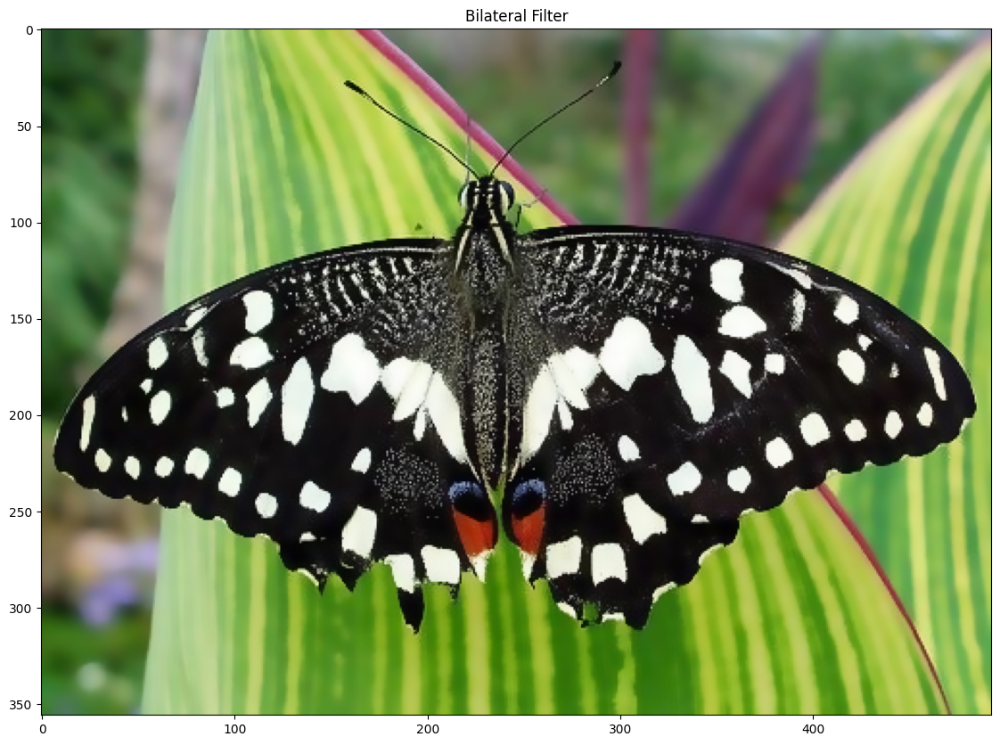

In [8]:
# Bilateral filter  - used for noise removal while keeping the edges sharp
# dst = cv2.bilateralFilter(src,d,sigmaColor,sigmaSpace)


bilateralfilter = cv2.bilateralFilter(img,9,75,75)
imshow('Bilateral Filter',bilateralfilter)

In [9]:
# Image denoising  - Non local Denoising
# There are 4 variations of Non Local Means Denoising
# cv2.fastNlMeansDenoising() - works with a single grayscale image
# cv2.fastNlMeansDenoisingColored() - works with a color image
# cv2.fastNlMeansDenoisingMulti() - works with image sequence captured in short period of time
# cv2.fastNlMeansDenoisingColoredMulti() - same as above but for colored images

# cv2.fastNlMeansDenoisingColored(src, None, h, hForColorComponents, templateWindowSize, searchWindowSize)
# h - parameter regulating filter strength for luminance component
# hForColorComponents - same as h but for color components
# templateWindowSize - size in pixels of the window that is used to compute the weighted average for a given pixel
# searchWindowSize - size in pixels of the window that is used to search for the most similar window


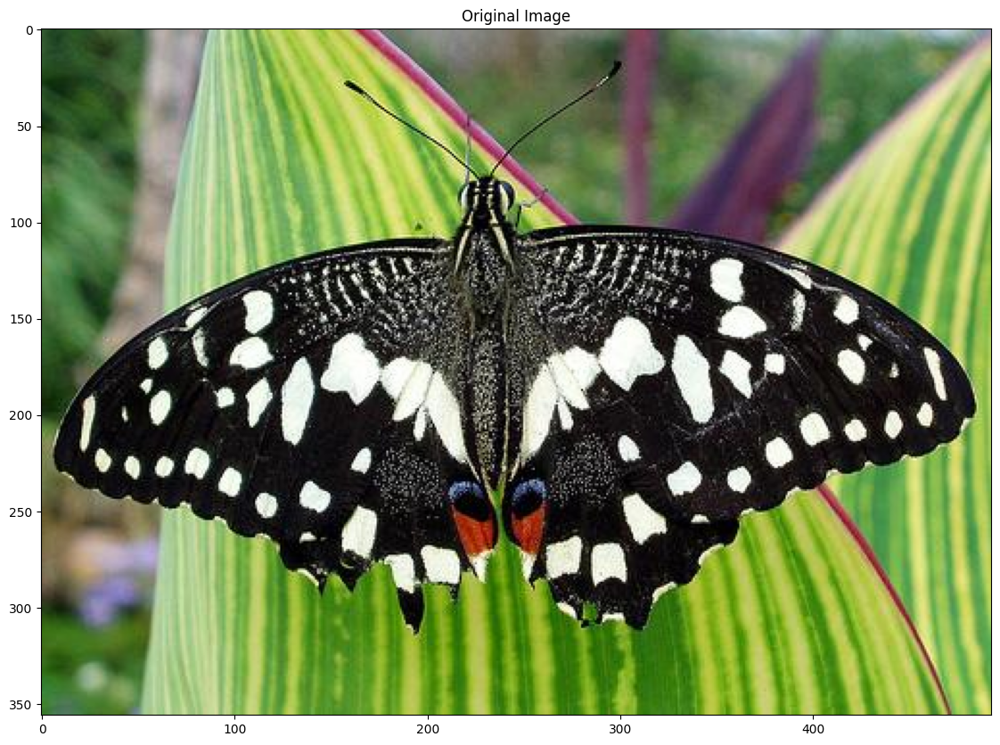

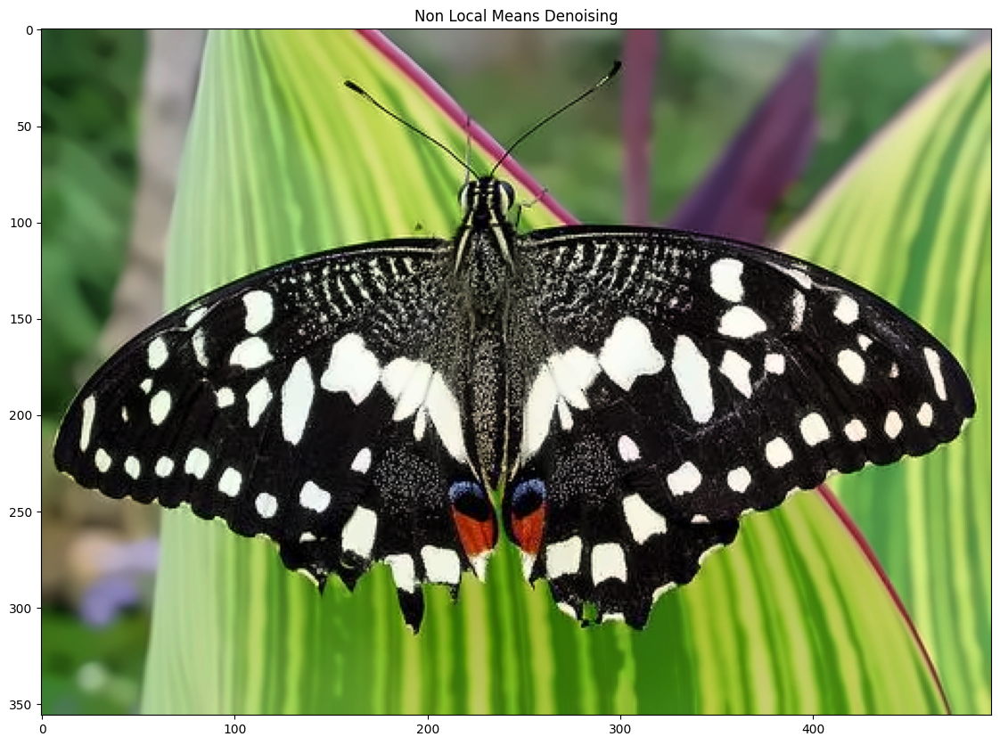

In [10]:
img = cv2.imread('C:\\Users\\abhin\\OneDrive\\Documents\\GitHub\\Computer-Vision\\data\\butterfly.jpg')
imshow('Original Image',img)

dst = cv2.fastNlMeansDenoisingColored(img,None,6,6,7,21)
imshow('Non Local Means Denoising',dst)

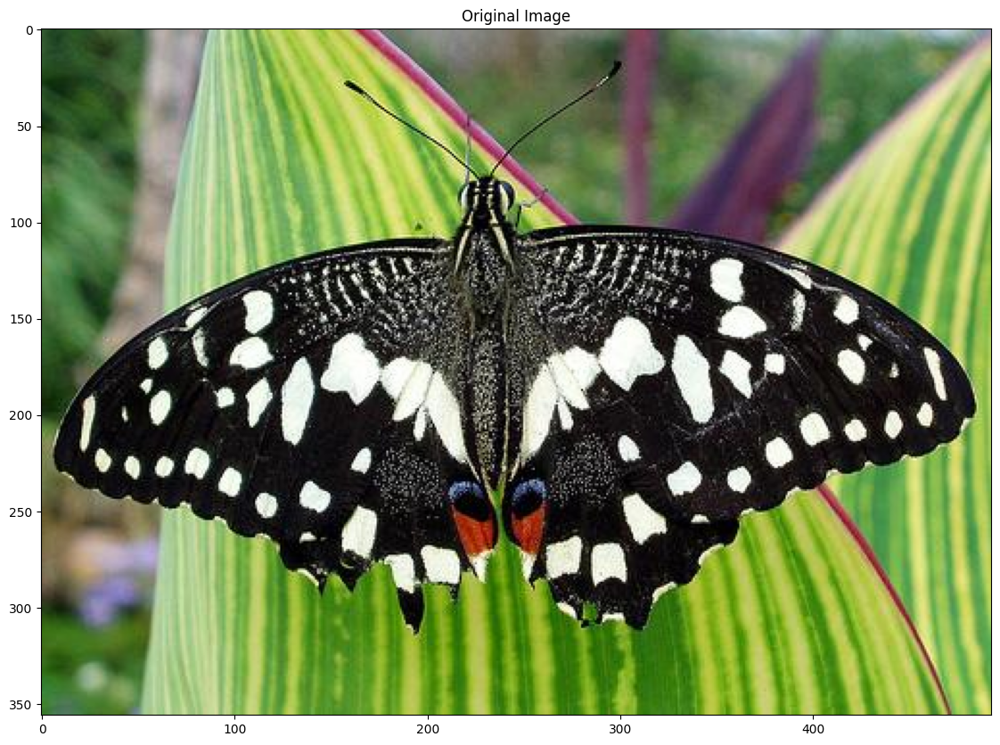

In [13]:
# Sharpening of the images 

img = cv2.imread('C:\\Users\\abhin\\OneDrive\\Documents\\GitHub\\Computer-Vision\\data\\butterfly.jpg')
imshow('Original Image',img)

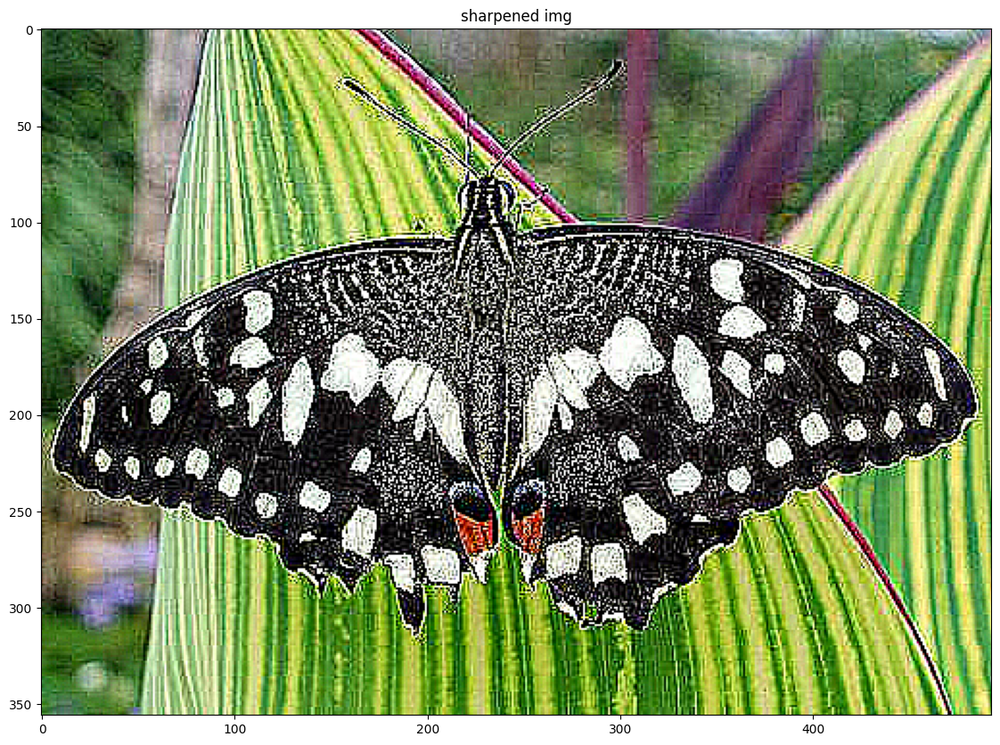

In [15]:
# Create  our sharpening kernel , remember it must sum to 1 

kernel_sharpening = np.array([[-1,-1,-1],
                              [-1,9,-1],
                              [-1,-1,-1]
                              ])

sharpened = cv2.filter2D(img,-1,kernel_sharpening)
imshow('sharpened img',sharpened)
